In [1]:
#University of Pisa
#ISPR Midterm-1
#Bisconti Elia, 518630

#Perform image segmentation on one of the eight image thematic subsets. Note that each file has a name starting with 
#a number from 1 to 8, which indicates the thematic subset, followed by the rest of the file name.
#I suggest to use image subsets “1_*” or “2_*”.  Use the normalized cut algorithm to perform image segmentation.
#You are welcome to confront the result with kmeans segmentation algorithm if you wish.

In [2]:
#To re-run the code, download the zip and extract the images into a folder:

#http://download.microsoft.com/download/A/1/1/A116CD80-5B79-407E-B5CE-3D5C6ED8B0D5/msrc_objcategimagedatabase_v1.zip

In [3]:
import os
import matplotlib.pyplot as plt

from skimage import data, segmentation, color
from skimage.segmentation import felzenszwalb, slic, quickshift, watershed
from skimage.future import graph


In [4]:
import numpy as np
import cv2

In [5]:
def load_image(folder,prefix):
    images = []
    for filename in os.listdir(folder):
        if filename.startswith(prefix) and filename.endswith("_s.bmp"):

            img = plt.imread(os.path.join(folder,filename))
            print(filename)
            if img is not None:
                images.append(img)
    return images

In [6]:
folder = "MSRC_ObjCategImageDatabase_v1"
prefix = "1_"

In [7]:
images = load_image(folder, prefix)

print("len: ",len(images))

1_10_s.bmp
1_11_s.bmp
1_12_s.bmp
1_13_s.bmp
1_14_s.bmp
1_15_s.bmp
1_16_s.bmp
1_17_s.bmp
1_18_s.bmp
1_19_s.bmp
1_1_s.bmp
1_20_s.bmp
1_21_s.bmp
1_22_s.bmp
1_23_s.bmp
1_24_s.bmp
1_25_s.bmp
1_26_s.bmp
1_27_s.bmp
1_28_s.bmp
1_29_s.bmp
1_2_s.bmp
1_30_s.bmp
1_3_s.bmp
1_4_s.bmp
1_5_s.bmp
1_6_s.bmp
1_7_s.bmp
1_8_s.bmp
1_9_s.bmp
len:  30


In [8]:
images[1]

array([[[216, 210, 220],
        [218, 212, 222],
        [216, 213, 222],
        ...,
        [223, 227, 238],
        [220, 228, 239],
        [221, 227, 239]],

       [[216, 215, 223],
        [216, 215, 223],
        [217, 216, 224],
        ...,
        [220, 229, 238],
        [220, 229, 238],
        [220, 229, 238]],

       [[218, 217, 225],
        [217, 217, 227],
        [219, 217, 228],
        ...,
        [219, 228, 237],
        [220, 228, 239],
        [220, 229, 238]],

       ...,

       [[148, 154,  58],
        [149, 162,  58],
        [156, 164,  63],
        ...,
        [177, 168,  93],
        [177, 163,  88],
        [141, 131,  44]],

       [[148, 156,  55],
        [147, 157,  57],
        [151, 158,  65],
        ...,
        [144, 138,  55],
        [166, 161,  72],
        [156, 149,  60]],

       [[148, 159,  57],
        [153, 164,  72],
        [139, 145,  54],
        ...,
        [170, 164,  78],
        [166, 153,  74],
        [175, 160,  75]]

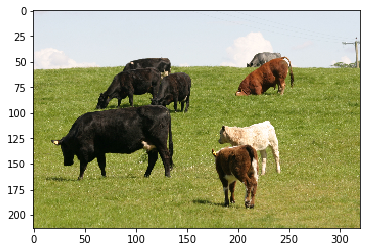

In [13]:
plt.imshow(images[1])


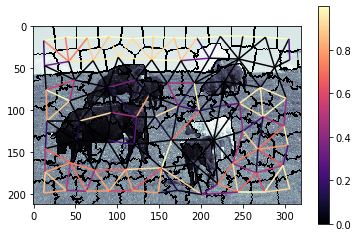

In [12]:
#Plot the RAG
l = segmentation.slic(images[1])
gmc = graph.rag_mean_color(images[1], l, mode='similarity')
lc = graph.show_rag(l, gmc, images[1])
cbar = plt.colorbar(lc)
    

In [9]:

def myNCut(img, c, n):
    #Segments image using k-means clustering using colors and coordinates.
    #compactness: higher value makes superpixel shapes more square/cubic (0.01, 0.1, 1, 10, 100)
    #nsegment: the (approximate) number of labels in the segmented output image.
    
    labels1 = segmentation.slic(img, compactness=c, n_segments=n)
    #labels1 = quickshift(img, kernel_size=3, max_dist=6, ratio=0.5)
    
    #king: ‘avg’ replaces each labeled segment with its average color, for a stained-class or pastel painting appearance.
    out1 = color.label2rgb(labels1, img, kind='avg')

    #mode:
    #‘distance’ : The weight between two adjacent regions is the |c1−c2|, where c1 and c2 are the mean colors of the two regions. 
    #It represents the Euclidean distance in their average color.
    #‘similarity’ : The weight between two adjacent is e−d2/sigma where d=|c1−c2|, where c1 and c2 are the mean colors of the two regions.
    #It represents how similar two regions are.
    g = graph.rag_mean_color(img, labels1, mode='similarity')
    
    
    labels2 = graph.cut_normalized(labels1, g)
    out2 = color.label2rgb(labels2, img, kind='avg', bg_label=1)

    
    return out1, out2, len(np.unique(labels1))

In [10]:
def myKmeans(img, k):
    
    pixel_vals = img.reshape((-1,3))
    pixel_vals = np.float32(pixel_vals)
  
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.85)
  
    retval, labels, centers = cv2.kmeans(pixel_vals, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

    # convert data into 8-bit values
    centers = np.uint8(centers)
    segmented_data = centers[labels.flatten()]

    # reshape data into the original image dimensions
    segmented_image = segmented_data.reshape((img.shape))
    
    return segmented_image

In [11]:
def myPlot(img, slicOut1, segOut1, nSegSlic1, slicOut2, segOut2, nSegSlic2, kmeans1, kmeans2):
    plt.imshow(img)
    fig, ax = plt.subplots(nrows = 3, ncols=2, sharex=True, sharey=True, figsize=(10, 12))

    ax[0][0].imshow(slicOut1)
    ax[0][0].title.set_text("Slic nseg: " +str(nSegSlic1))
    ax[0][1].imshow(segOut1)
    ax[0][1].title.set_text("N Cut" )

    ax[1][0].imshow(slicOut2)
    ax[1][0].title.set_text("Slic nseg: " +str(nSegSlic2))

    ax[1][1].imshow(segOut2)
    ax[1][1].title.set_text("N Cut" )

    ax[2][0].imshow(kmeans1)
    ax[2][0].title.set_text("Kmeans K=3")

    ax[2][1].imshow(kmeans2)
    ax[2][1].title.set_text("Kmeans K=9")

    for a in ax:
        for aa in a:
            aa.axis('off')

    plt.tight_layout()

In [12]:
def executeAll(img):
    slicOut1, segOut1, nSegSlic1 = myNCut(img, 10, 200)
    slicOut2, segOut2, nSegSlic2 = myNCut(img, 30, 600)
    
    kmeans1 = myKmeans(img, 3)
    kmeans2 = myKmeans(img, 9)
    myPlot(img, slicOut1, segOut1, nSegSlic1, slicOut2, segOut2, nSegSlic2, kmeans1, kmeans2)
    return

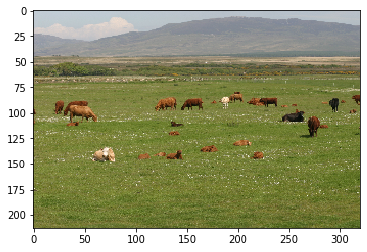

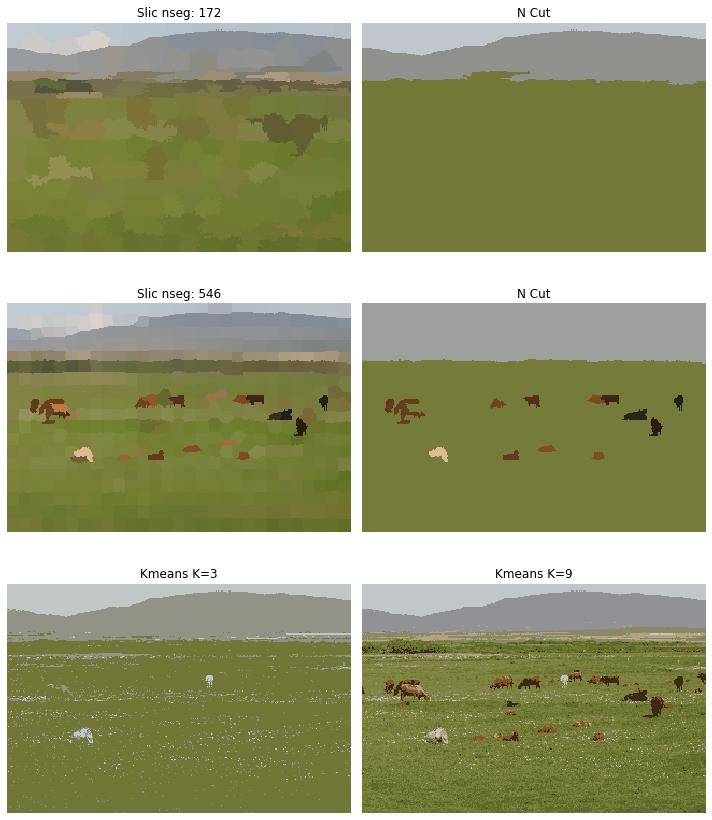

In [13]:
executeAll(images[0])

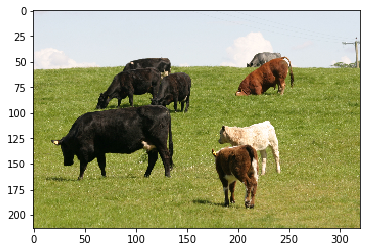

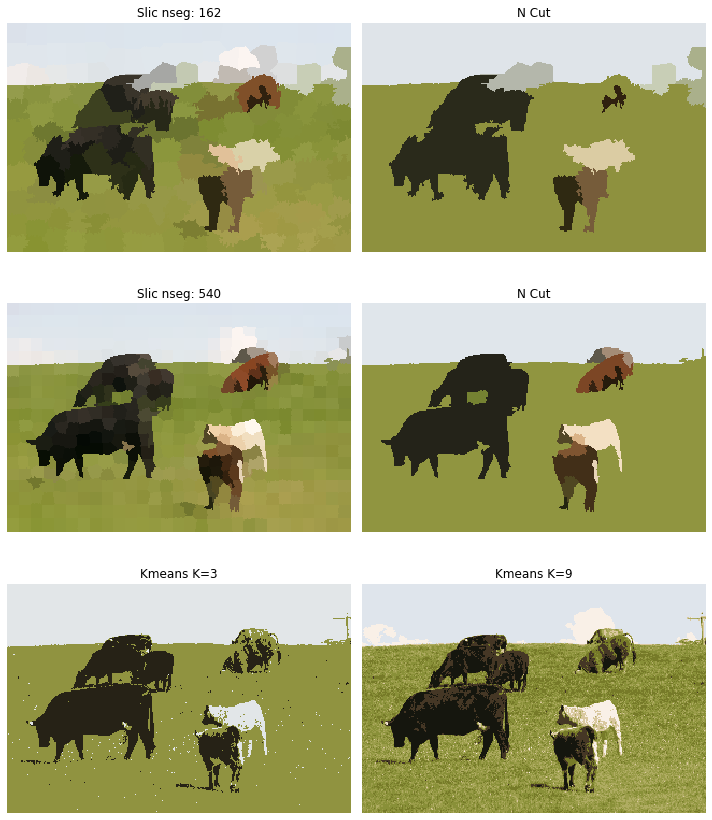

In [14]:
executeAll(images[1])

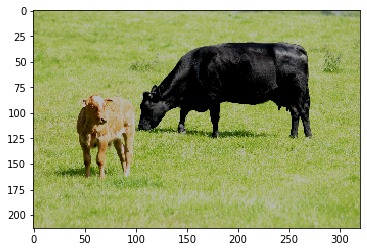

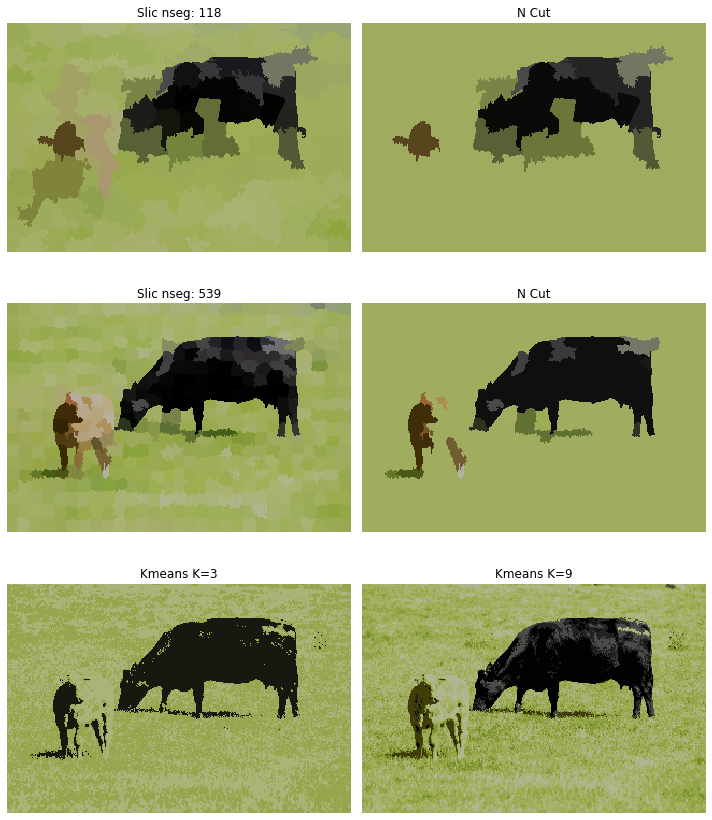

In [15]:
executeAll(images[2])

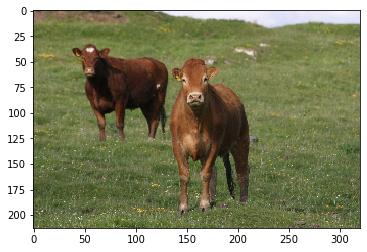

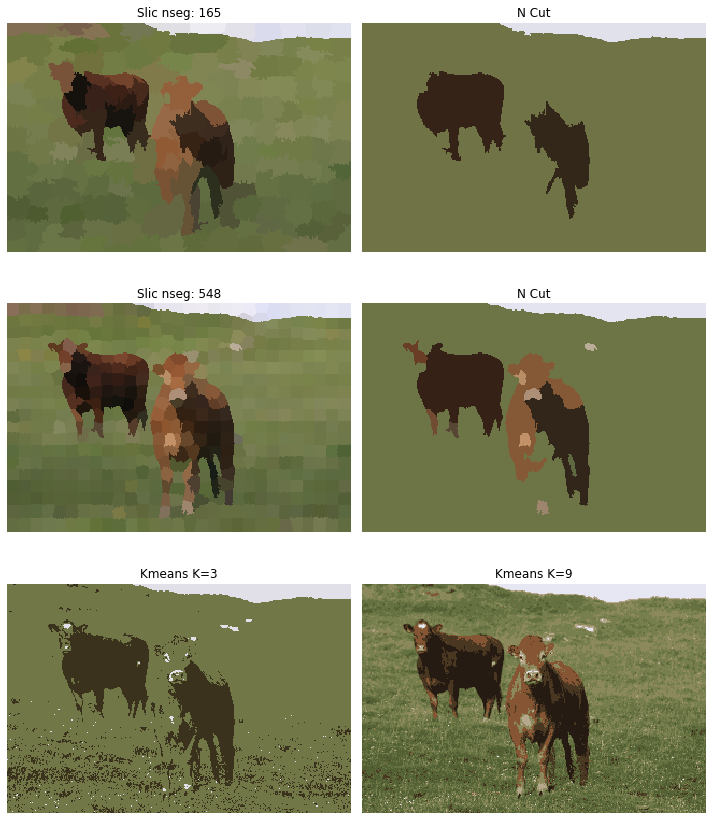

In [16]:
executeAll(images[3])

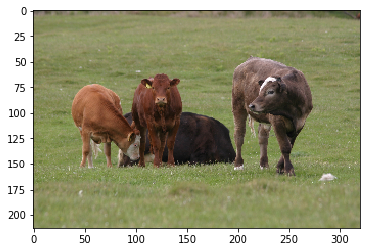

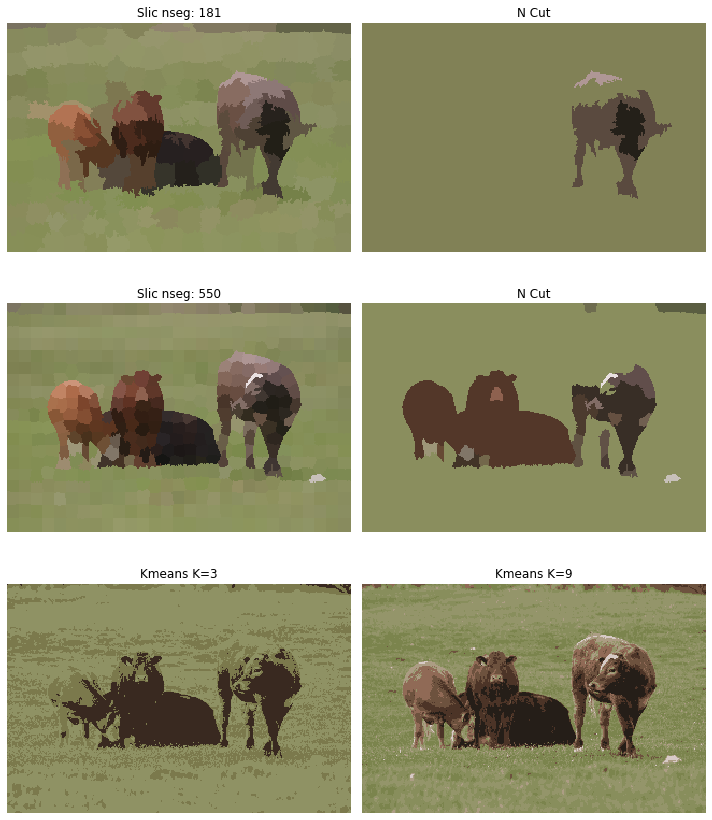

In [17]:
executeAll(images[4])

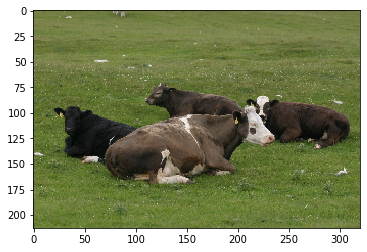

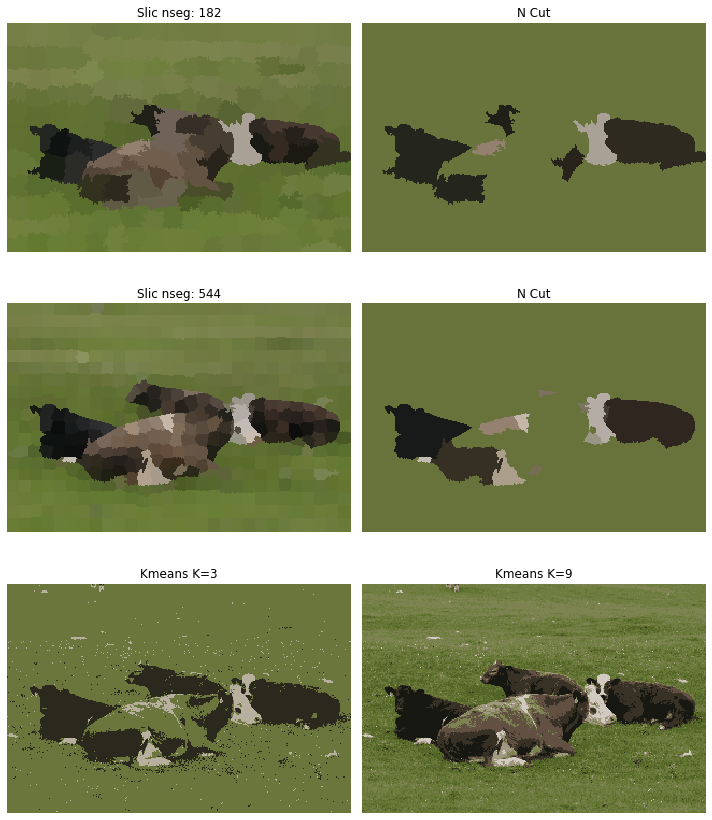

In [18]:
executeAll(images[5])

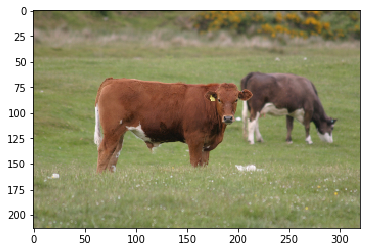

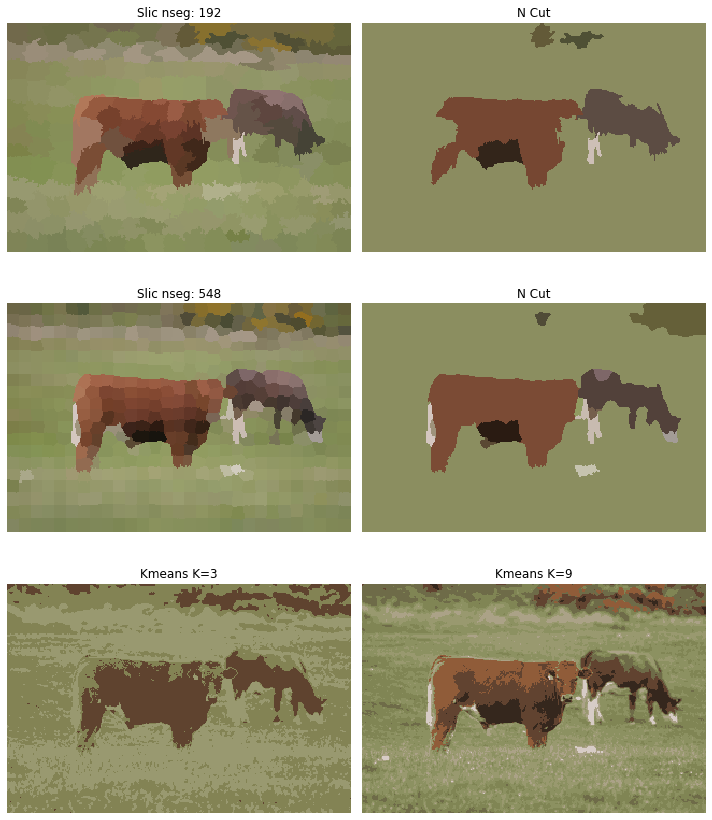

In [19]:
executeAll(images[6])

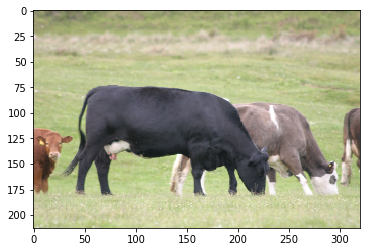

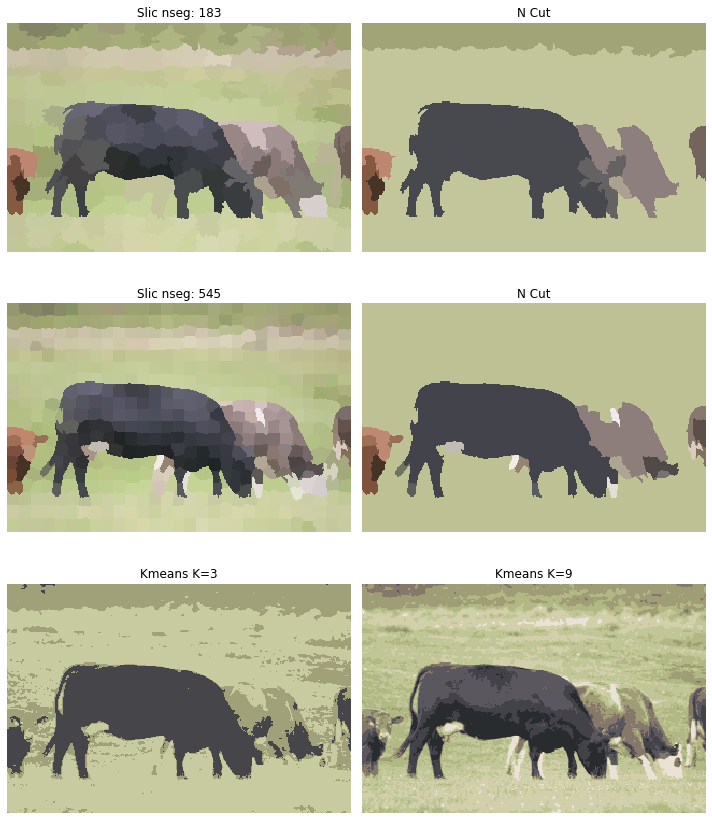

In [20]:
executeAll(images[7])

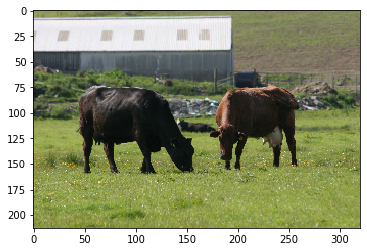

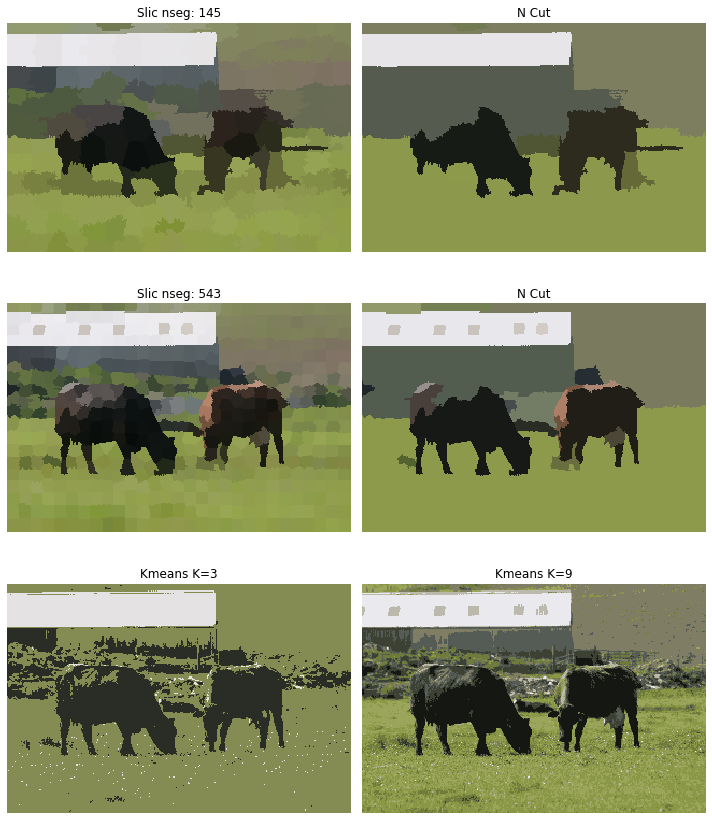

In [21]:
executeAll(images[8])

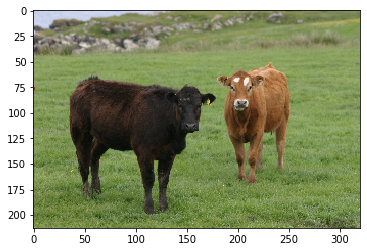

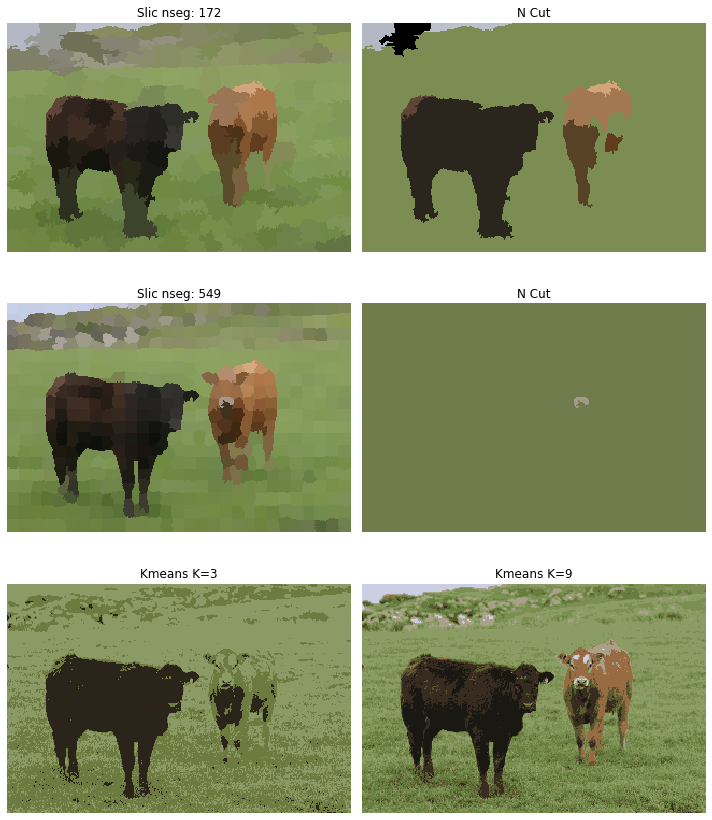

In [22]:
executeAll(images[9])

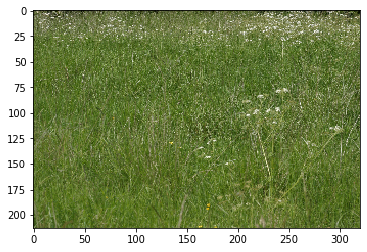

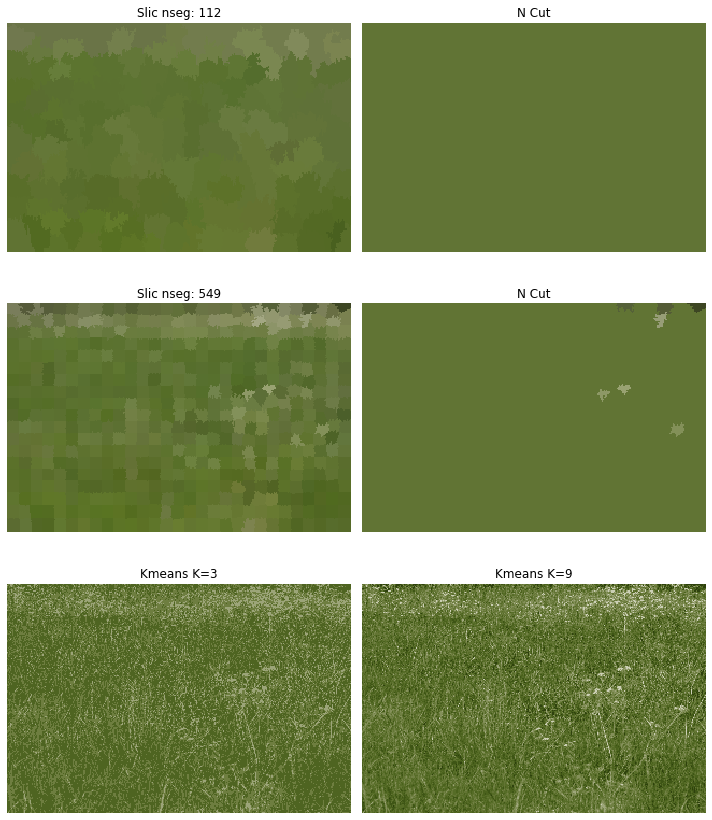

In [23]:
executeAll(images[10])

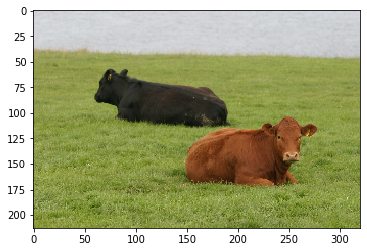

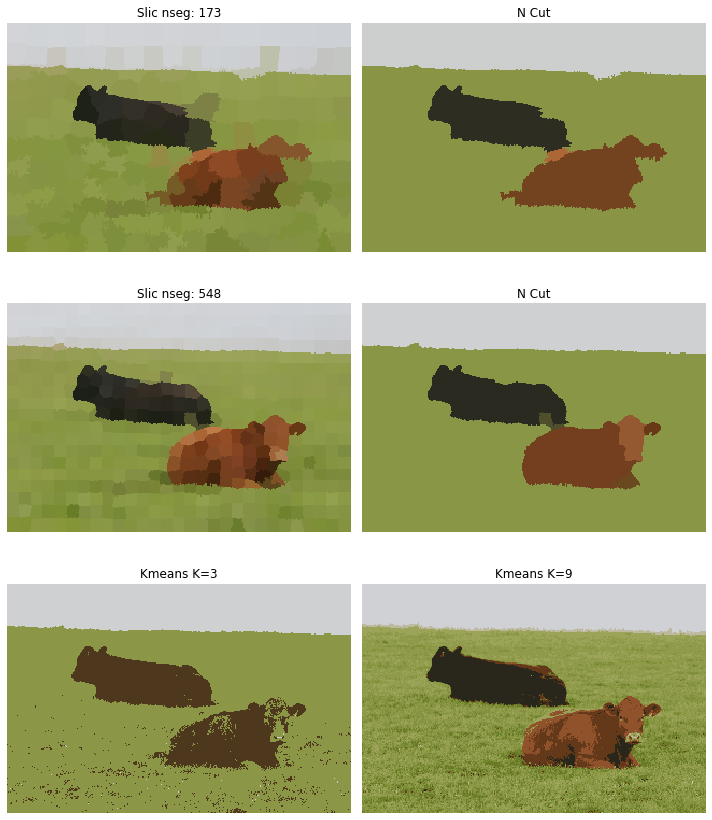

In [24]:
executeAll(images[11])

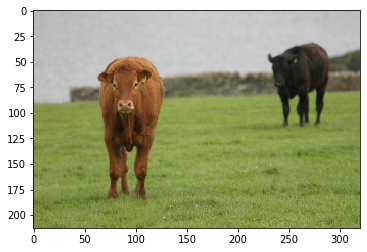

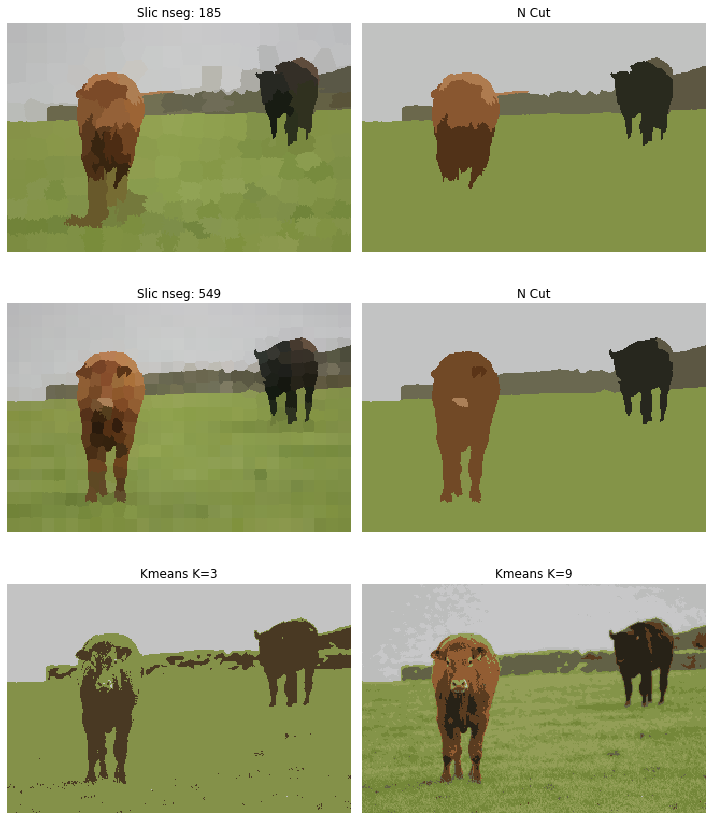

In [25]:
executeAll(images[12])

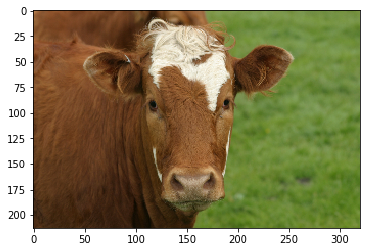

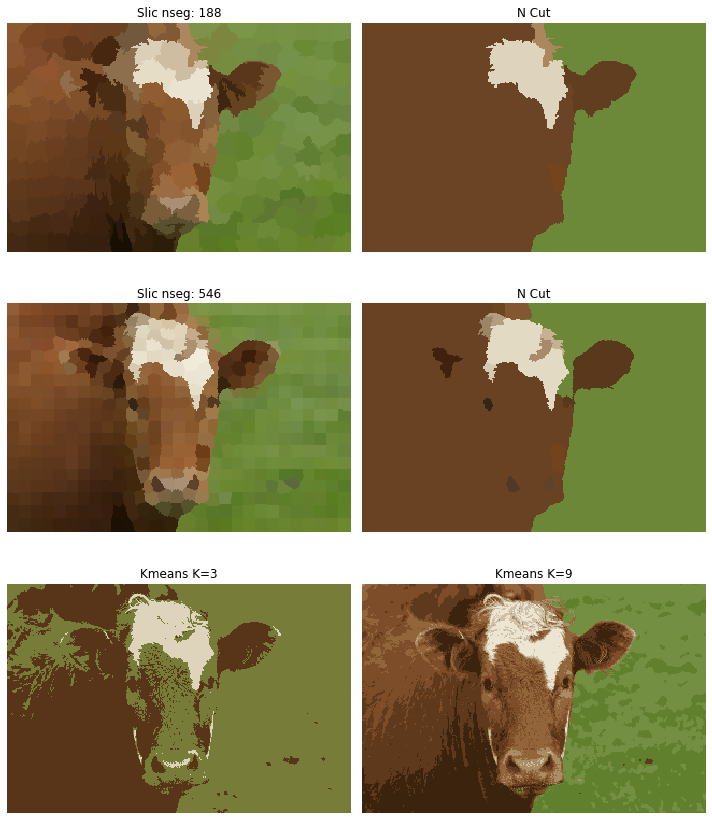

In [26]:
executeAll(images[13])

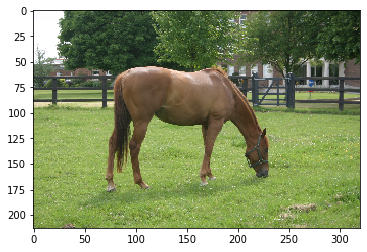

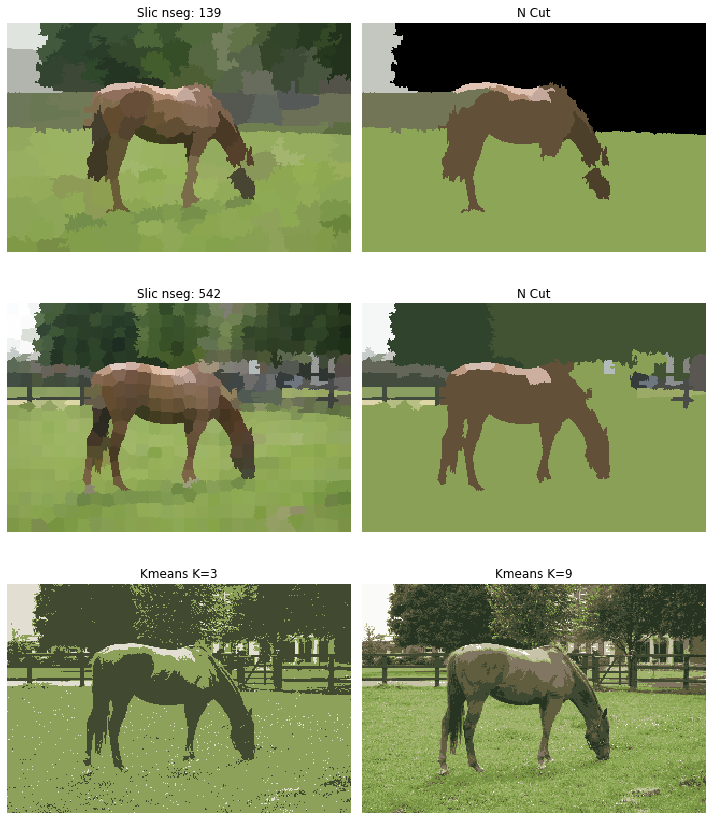

In [27]:
executeAll(images[14])

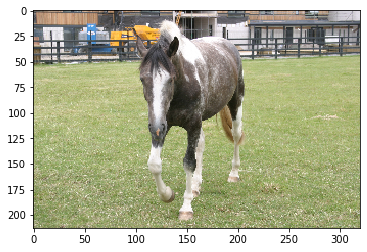

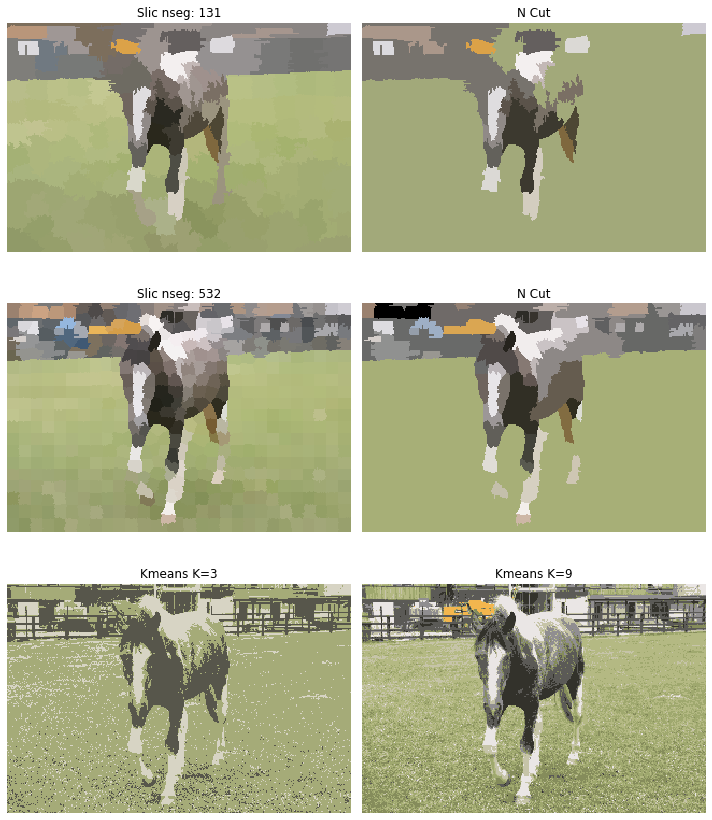

In [28]:
executeAll(images[15])

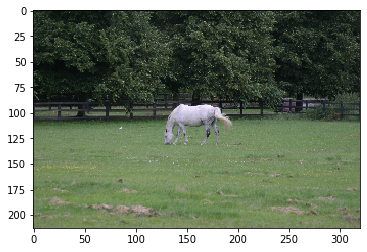

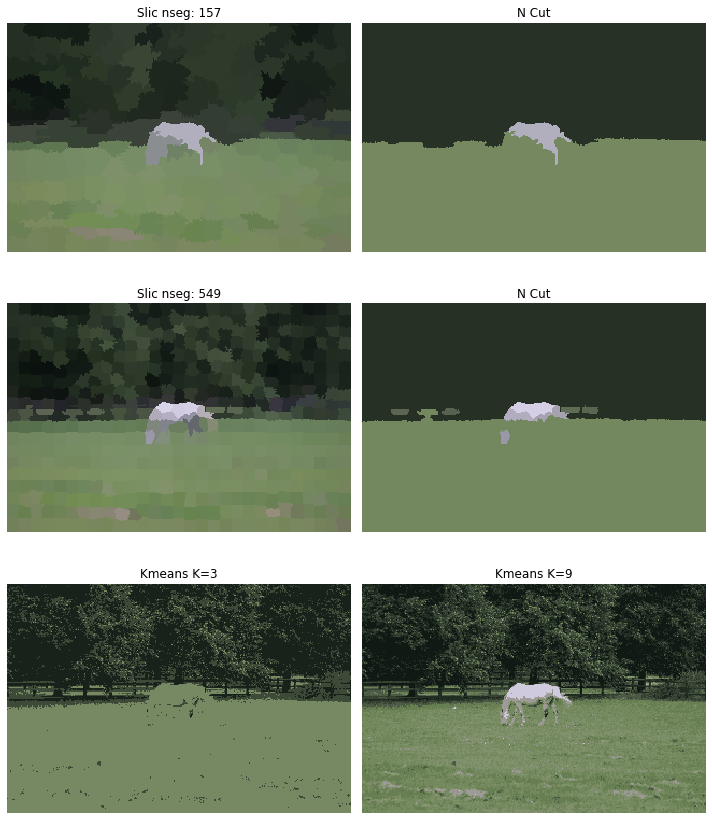

In [29]:
executeAll(images[16])

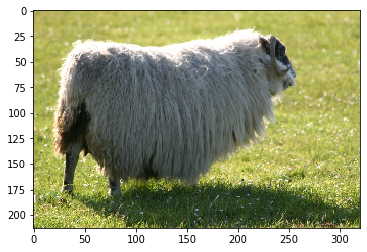

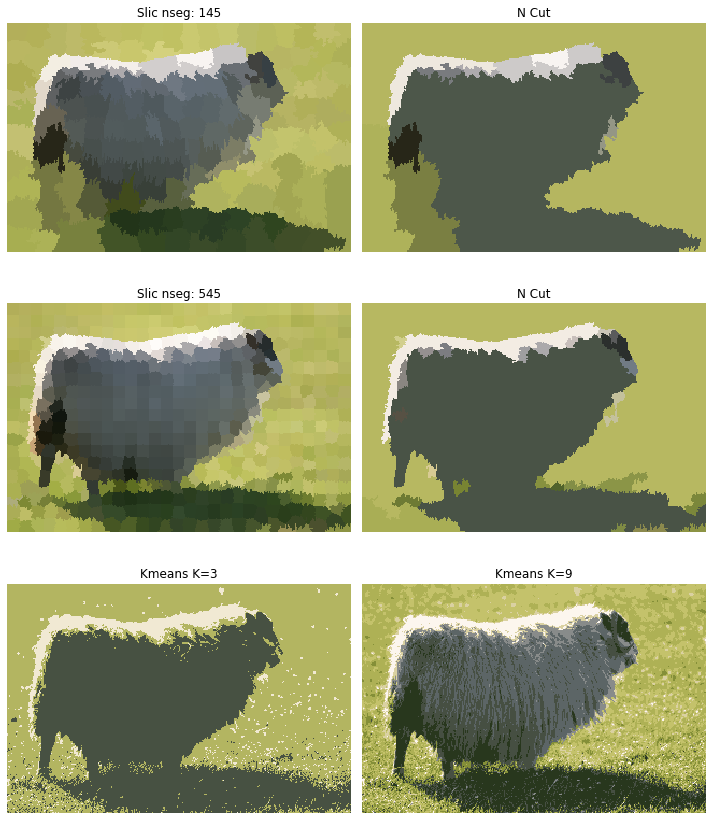

In [30]:
executeAll(images[17])

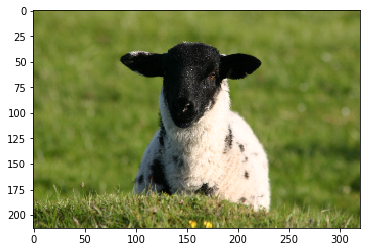

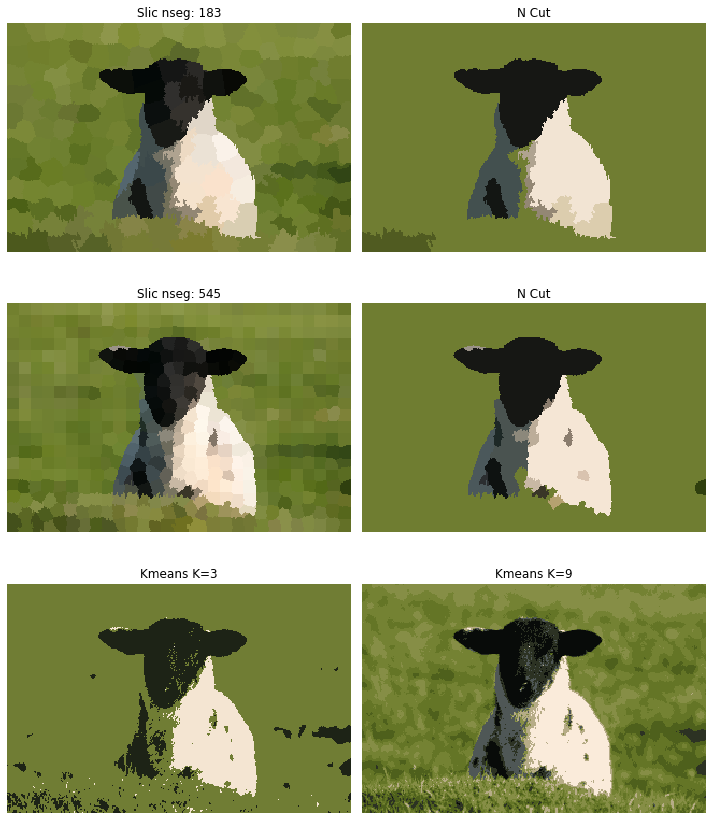

In [31]:
executeAll(images[18])

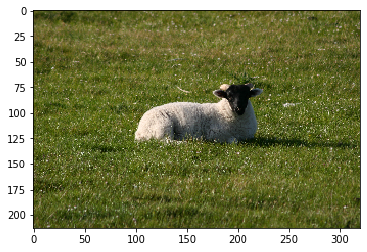

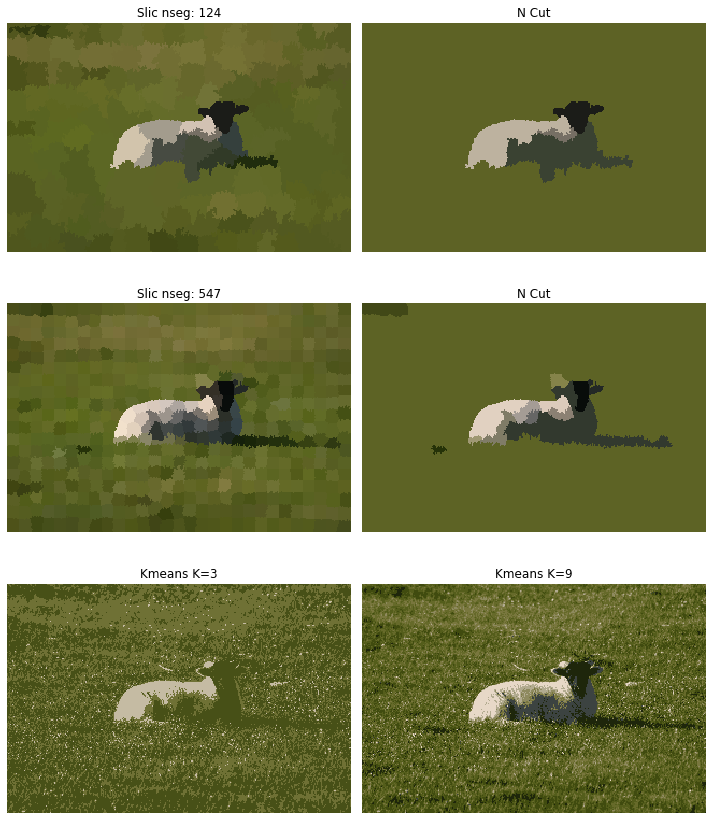

In [32]:
executeAll(images[19])

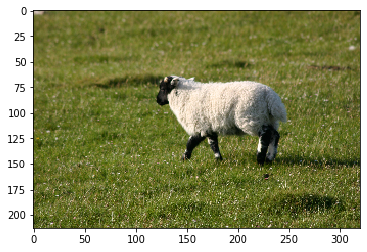

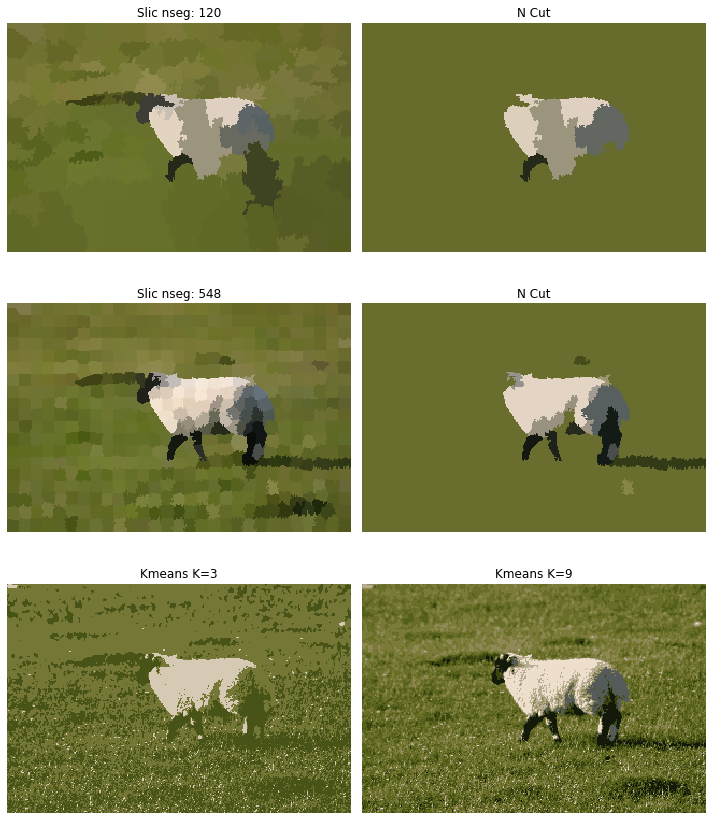

In [33]:
executeAll(images[20])

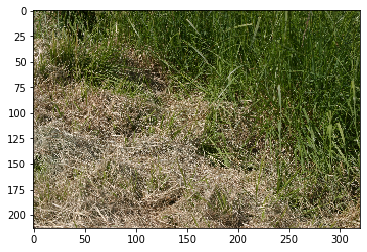

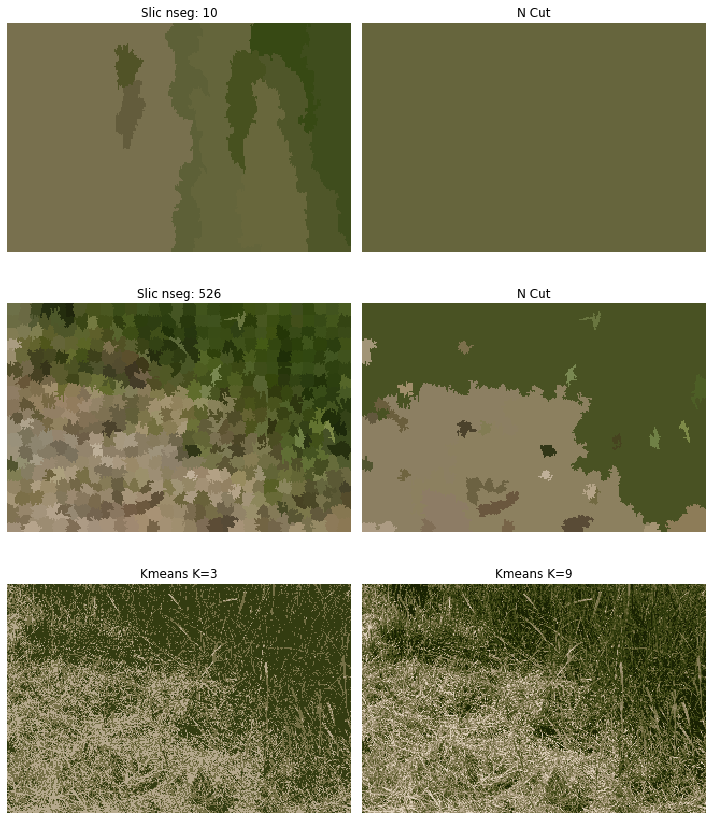

In [34]:
executeAll(images[21])

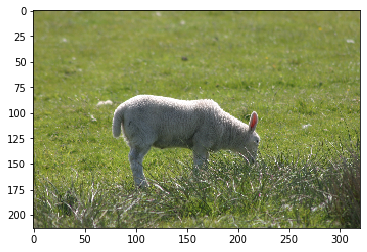

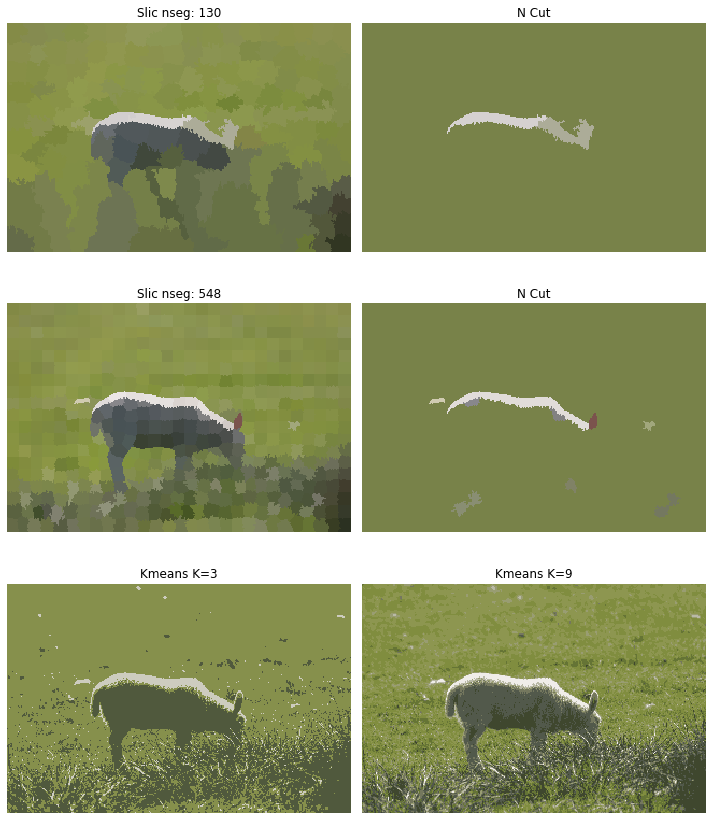

In [35]:
executeAll(images[22])

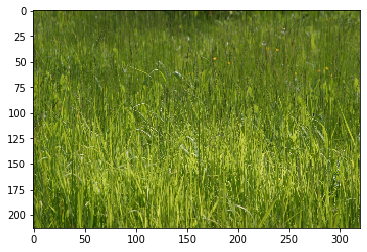

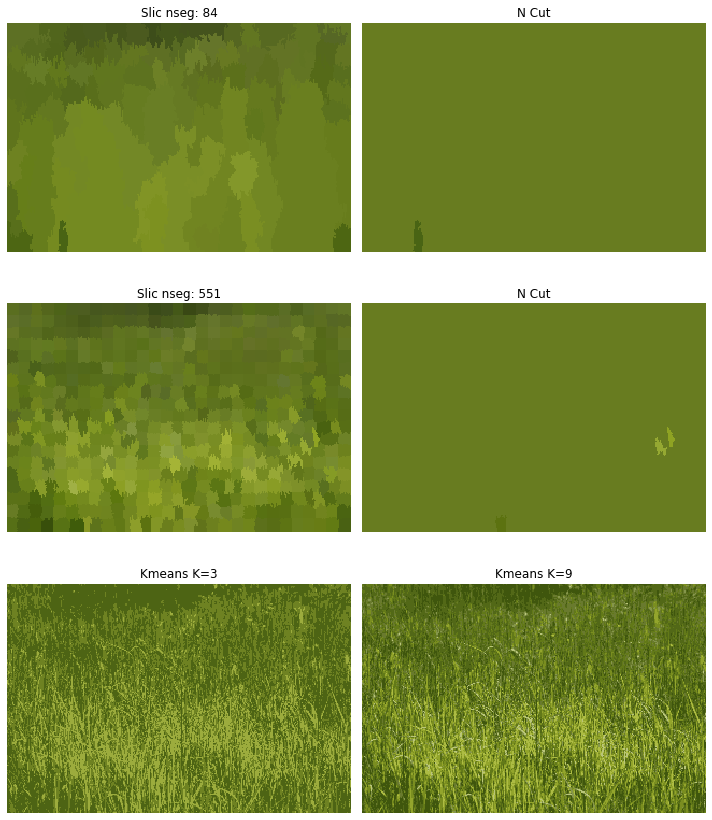

In [36]:
executeAll(images[23])

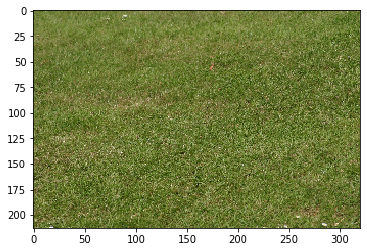

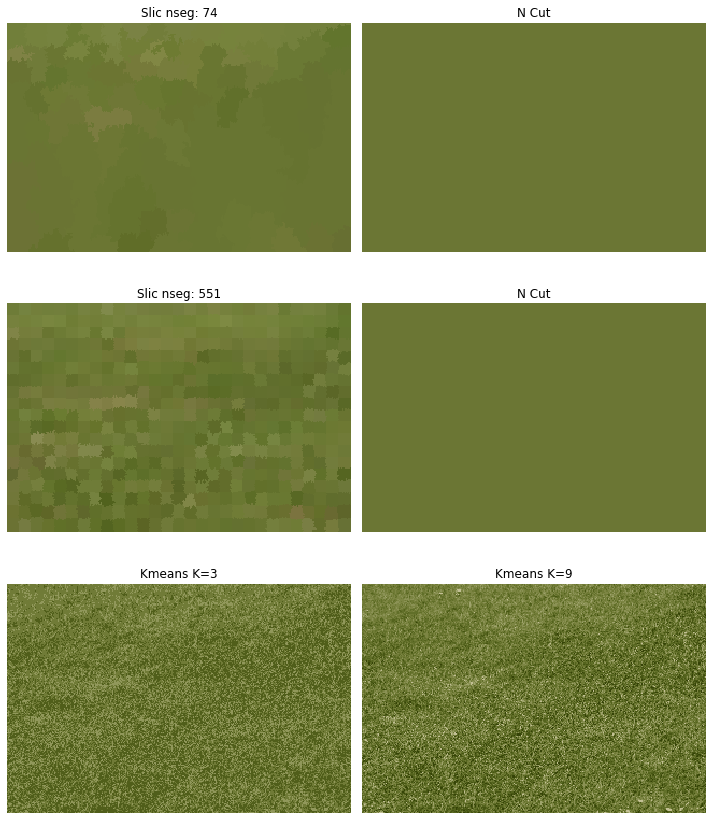

In [37]:
executeAll(images[24])

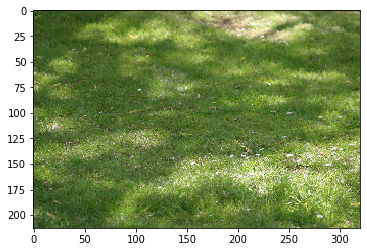

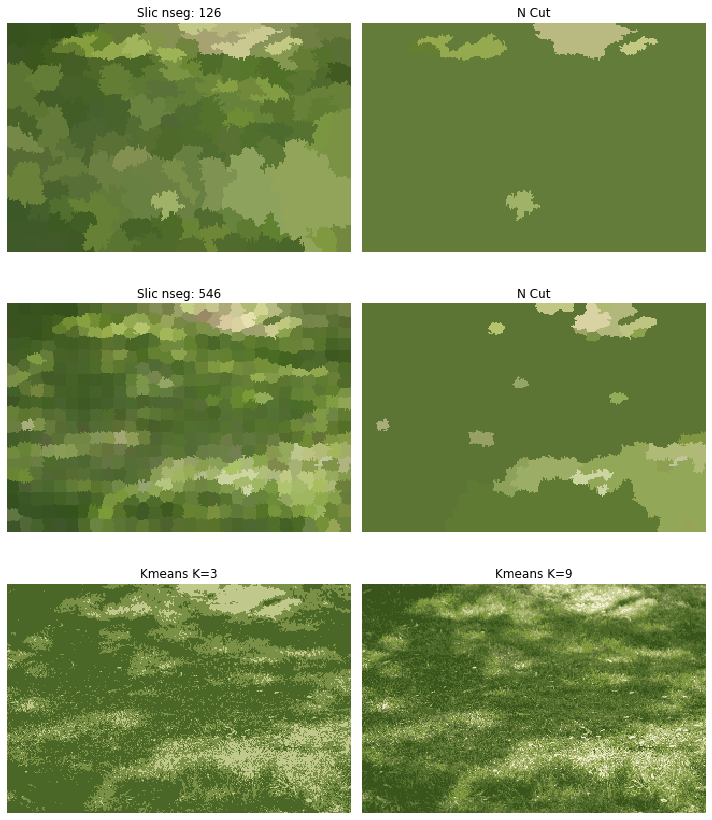

In [38]:
executeAll(images[25])

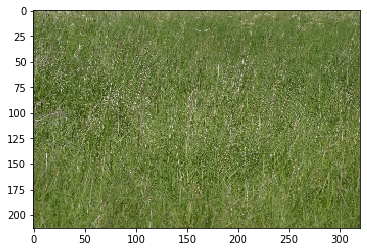

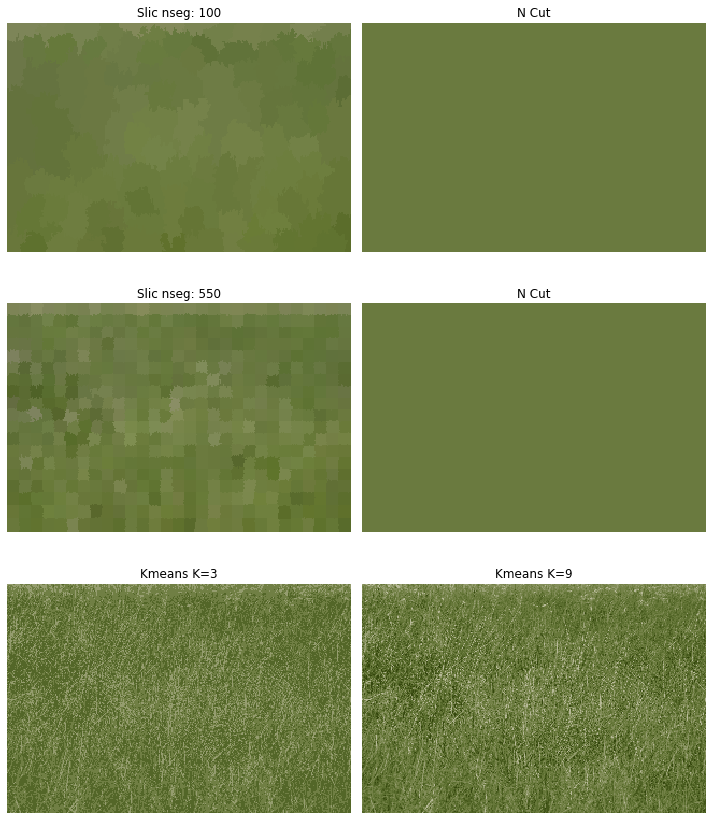

In [39]:
executeAll(images[26])

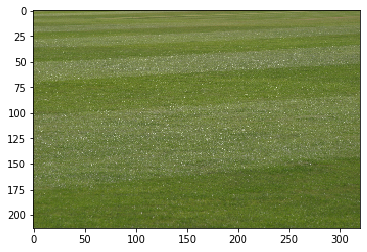

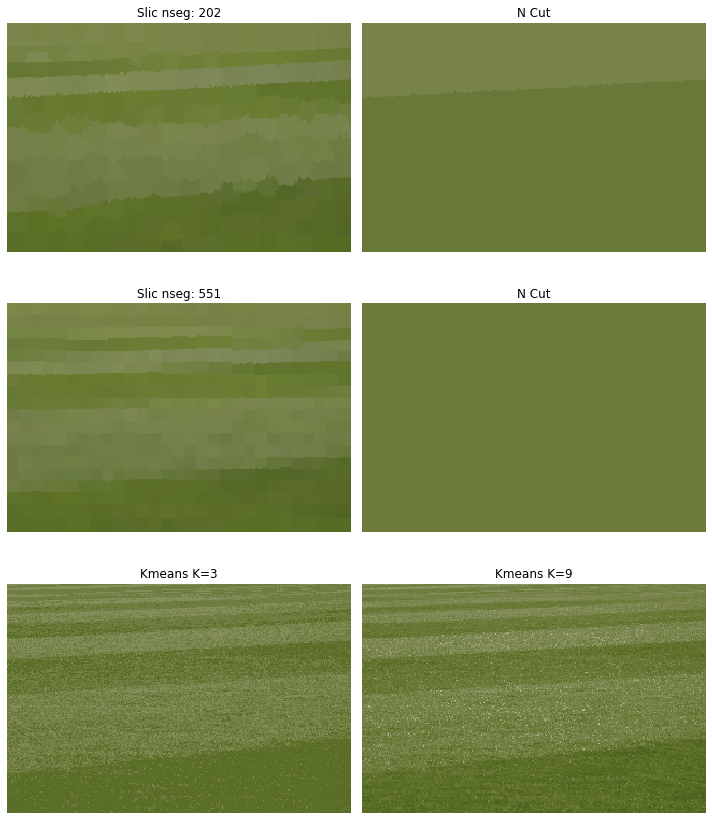

In [40]:
executeAll(images[27])

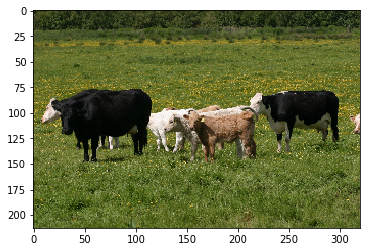

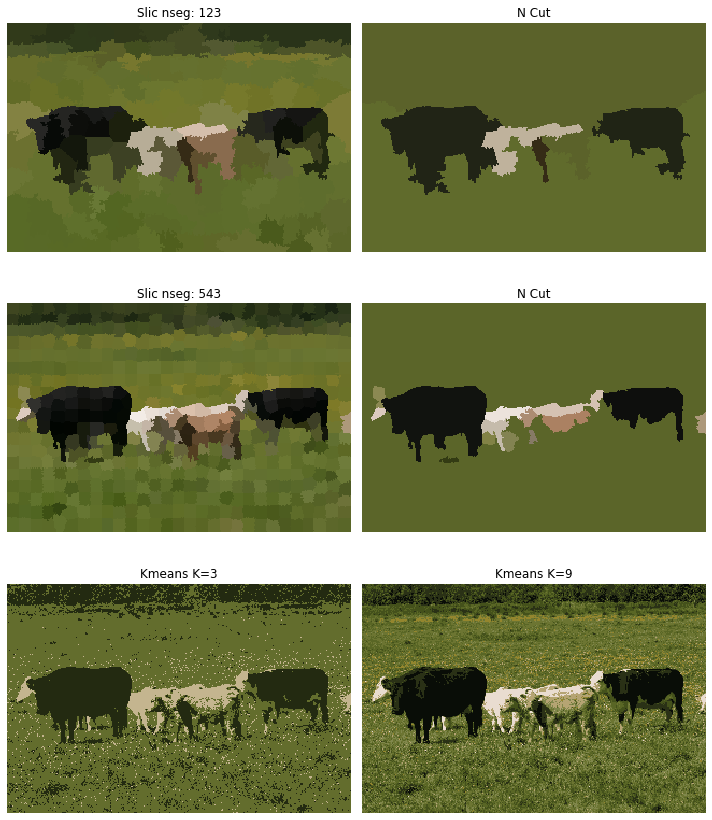

In [41]:
executeAll(images[28])

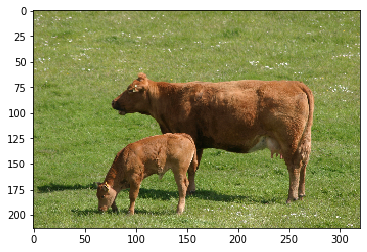

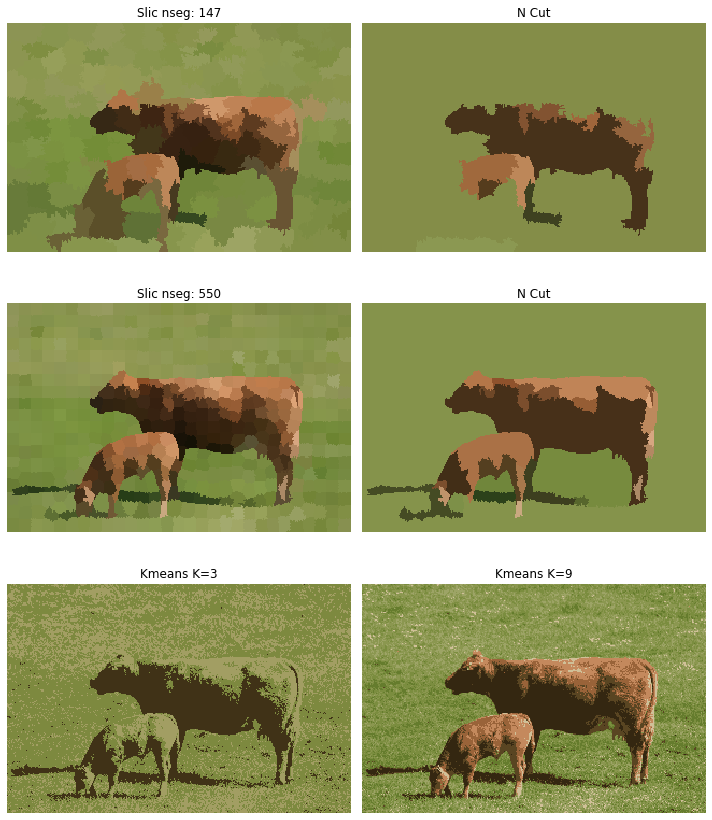

In [42]:
executeAll(images[29])